In [1]:
from PIL import Image
from dask import delayed
import numpy as np
import math
import cv2

import glob
from scipy import ndimage
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy import ndimage as ndi
import scipy.misc
from skimage import exposure
import os 
import multiprocessing
#from dask.distributed import Client, progress
import dask.array as da
#import dask_ndmeasure
import dask
import dask.threaded
from scipy.ndimage.measurements import center_of_mass
from scipy.optimize import linear_sum_assignment
from scipy.spatial import distance
import scipy.linalg as sla
from dask.multiprocessing import get as mp_get
#from dask_ml.cluster import SpectralClustering


In [2]:
global sigma1
global kernel_size 
global weak_pixel
global strong_pixel

sigma1=1
kernel_size=5
weak_pixel=75
strong_pixel=255
 

def gaussian_kernel(size, sigma=1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g

def sobel_filters(img):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)

    Ix = ndimage.filters.convolve(img, Kx)
    Iy = ndimage.filters.convolve(img, Ky)

    G = np.hypot(Ix, Iy)
    G = G / G.max() * 255
    theta = np.arctan2(Iy, Ix)
    return (G, theta)


def non_max_suppression(img, D):
    M, N = img.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180


    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255

               #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                #angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0


            except IndexError as e:
                pass

    return Z

def threshold(img, highThreshold, lowThreshold):

    highThreshold = img.max() * highThreshold;
    lowThreshold = highThreshold * lowThreshold;

    M, N = img.shape
    res = np.zeros((M,N), dtype=np.int32)

    weak = np.int32(weak_pixel)
    strong = np.int32(strong_pixel)

    strong_i, strong_j = np.where(img >= highThreshold)
    zeros_i, zeros_j = np.where(img < lowThreshold)

    weak_i, weak_j = np.where((img <= highThreshold) & (img >= lowThreshold))

    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak

    return (res)

def hysteresis(img):

    M, N = img.shape
    weak = weak_pixel
    strong = strong_pixel

    for i in range(1, M-1):
        for j in range(1, N-1):
            if (img[i,j] == weak):
                try:
                    if ((img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong)
                        or (img[i, j-1] == strong) or (img[i, j+1] == strong)
                        or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong)):
                        img[i, j] = strong
                    else:
                        img[i, j] = 0
                except IndexError as e:
                    pass

    return img

In [3]:
 
def get_optical_flow(video_filename):
    """ Given a video filename, returns dx's and dy's for each time point"""
    
    mean_dxs = []
    mean_dys = []
    
    frame_num = 0

    cap = cv2.VideoCapture(video_filename)

    ret, frame1 = cap.read()

    prvs = cv2.cvtColor(frame1,cv2.COLOR_BGR2GRAY)
    hsv = np.zeros_like(frame1)
    hsv[...,1] = 255

    while(True):
        ret, frame2 = cap.read()
        if not ret:
            break

        nextf = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY)

        flow = cv2.calcOpticalFlowFarneback(prvs,nextf, None, 0.5, 3, 15, 3, 5, 1.2, 0)

        prvs = nextf

        dx, dy = np.reshape(np.swapaxes(flow,0,2), (2, -1))

        mean_dxs.append(np.mean(dx))
        mean_dys.append(np.mean(dy))

        frame_num += 1
        if frame_num >= len(video_filename): 
            break
    return mean_dxs, mean_dys



In [4]:
def visualize2(imgs, im_name='vis.png', format=None, gray=False):
    plt.figure(figsize=(20, 50))
    for i, img in enumerate(imgs):
#         if img.shape[0] == 3:
#             img = img.transpose(1,2,0)
        plt_idx = i+1
        plt.subplot(20, 5, plt_idx)
        plt.imshow(img, cmap = format)
        plt.grid(False)
        plt.colorbar()
    plt.savefig(im_name)
    #print (plt_idx)  
    plt.show()

In [83]:
def visualize3(imgs, im_name='vis.png', format=None, gray=False):
    plt.figure(figsize=(20, 20))
    for i, img in enumerate(imgs):
#         if img.shape[0] == 3:
#             img = img.transpose(1,2,0)
        plt_idx = i+1
        plt.subplot(3, 3, plt_idx)
        plt.imshow(img, cmap = format)
        plt.grid(False)
        plt.colorbar()
    plt.savefig(im_name)
    #print (plt_idx)  
    plt.show()

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


def make_colormap(seq):
    """Return a LinearSegmentedColormap
    seq: a sequence of floats and RGB-tuples. The floats should be increasing
    and in the interval (0,1).
    """
    seq = [(None,) * 3, 0.0] + list(seq) + [1.0, (None,) * 3]
    cdict = {'red': [], 'green': [], 'blue': []}
    for i, item in enumerate(seq):
        if isinstance(item, float):
            r1, g1, b1 = seq[i - 1]
            r2, g2, b2 = seq[i + 1]
            cdict['red'].append([item, r1, r2])
            cdict['green'].append([item, g1, g2])
            cdict['blue'].append([item, b1, b2])
    return mcolors.LinearSegmentedColormap('CustomMap', cdict)

In [6]:
def numpy2mp4(data, filepath, dsize1, dsize2):
    data_res= np.array([cv2.resize(img, dsize1, interpolation=cv2.INTER_CUBIC) for img in data])
    v = cv2.VideoWriter(filepath, fourcc = cv2.VideoWriter_fourcc(*'avc1'), isColor= True, fps= 15.15,apiPreference=cv2.CAP_FFMPEG, frameSize= dsize1)
    for datum in data_res:
        v.write(np.uint8(datum))
    v.release()

In [7]:
def colorit(image, cmap='jet'):
    cm = plt.get_cmap(cmap)
    colored_image = cm(image/np.max(image))
    colored_image = (colored_image[:, :, :3] * 255).astype(np.uint8)
    return colored_image

In [8]:
def normalization(img):
    v = img
    return (v - v.min()) / (v.max() - v.min())*255

In [9]:
file = '/home/msf47/Data/exercise_RnDEng_2021/Data/problem1_viralpropagation.tif'

from tifffile import imread
series = imread(file)
images = series[ :, 0, :, :]
virus_amts = series[ :, 1, :, :]
normed_vas = np.array([normalization(virus_amts[i]) for i in range(len(virus_amts))])
normed_images = np.array([normalization(images[i]) for i in range(len(images))])

colored_va = [colorit(image) for image in virus_amts]
colored_va = np.array(colored_va)
colored_images = [colorit(image) for image in images]
colored_images = np.array(colored_images)
colored_noremd_va = [colorit(image) for image in normed_vas]
colored_noremd_va = np.array(colored_noremd_va)
series.shape, images.shape, virus_amts.shape, colored_va.shape, colored_noremd_va.shape

((121, 2, 724, 724),
 (121, 724, 724),
 (121, 724, 724),
 (121, 724, 724, 3),
 (121, 724, 724, 3))

#### First, let me create videos from both channels to inspire from them and fully understand the problem. For that I created a function that can conver the numpy array into a MP4 video file.


In [10]:
output_path='/home/msf47/Data/exercise_RnDEng_2021/Data/videos/'
dsize1= (300, 300)
dsize2= (724, 724)


vid= colored_va
vid2= colored_images
vid3= colored_noremd_va
numpy2mp4(vid, output_path+'video2.mp4', dsize1, dsize2)
numpy2mp4(vid2, output_path+'video3.mp4', dsize1, dsize2)
numpy2mp4(vid3, output_path+'video3_normed.mp4', dsize1, dsize2)

vid.shape

(121, 724, 724, 3)

In [11]:
from IPython.display import HTML
from base64 import b64encode

def play(filename):
    html = ''
    video = open(filename,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=300 controls autoplay loop><source src="%s" type="video/mp4"></video>' % src 
    return HTML(html)

play('/home/msf47/Data/exercise_RnDEng_2021/videos/video3_normed.mp4')
#play('/Users/mojtaba/Downloads/exercise_RnDEng_2021/videos/video3.mp4')

### Now, let's play a bit with the data in both channels to get better understanding of that.

In [12]:
thr = [threshold(img, 0.35, .5) for img in normed_vas]

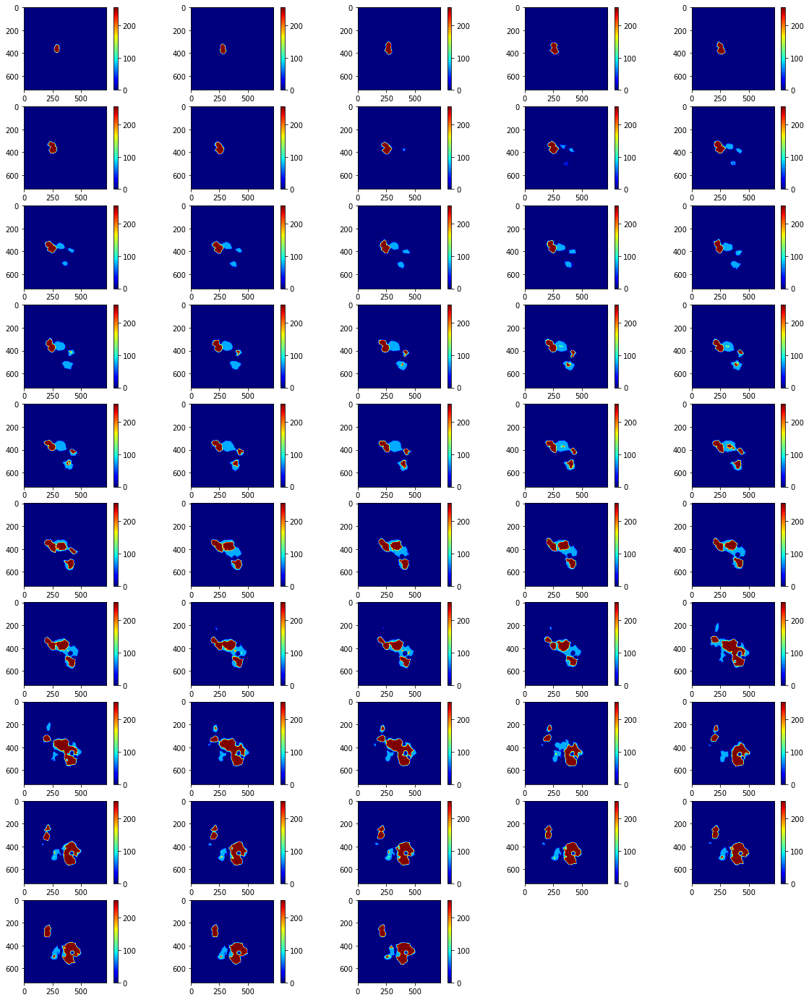

In [13]:
visualize2(thr[:48], format= 'jet')

In [116]:
thr2 = [threshold(img, 0.65, .95) for img in normed_images]

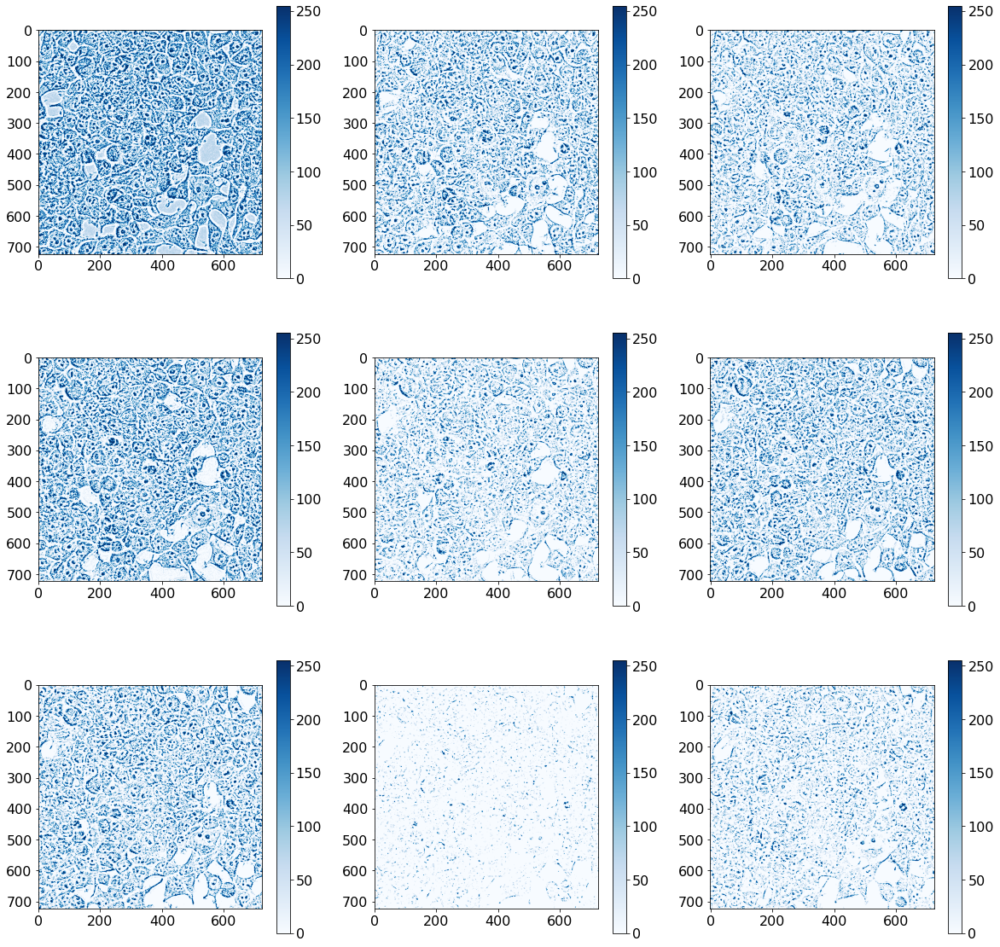

In [117]:
visualize3(thr2[:9], format= 'Blues')

In [118]:
nmx = [hysteresis(img) for img in normed_images]

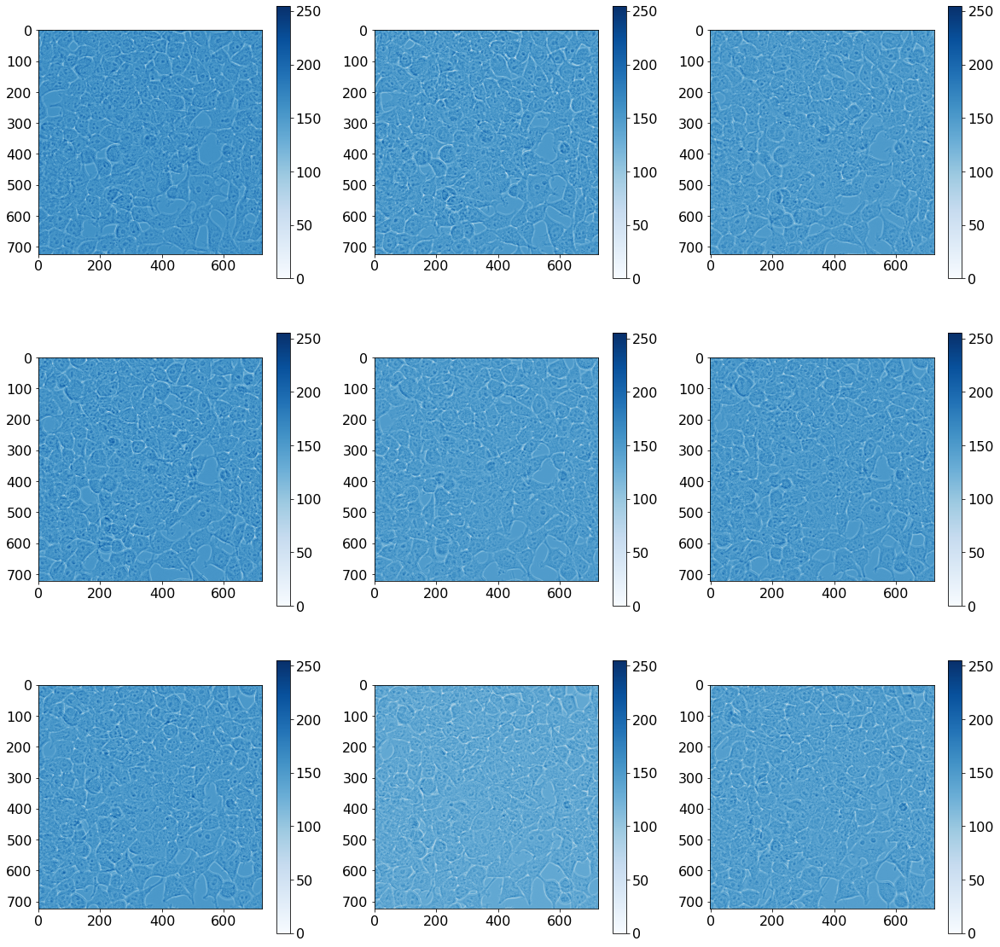

In [119]:
visualize3(nmx[:9], format= 'Blues')

In [122]:
thr3 = [threshold(img, 0.6, .95) for img in nmx]

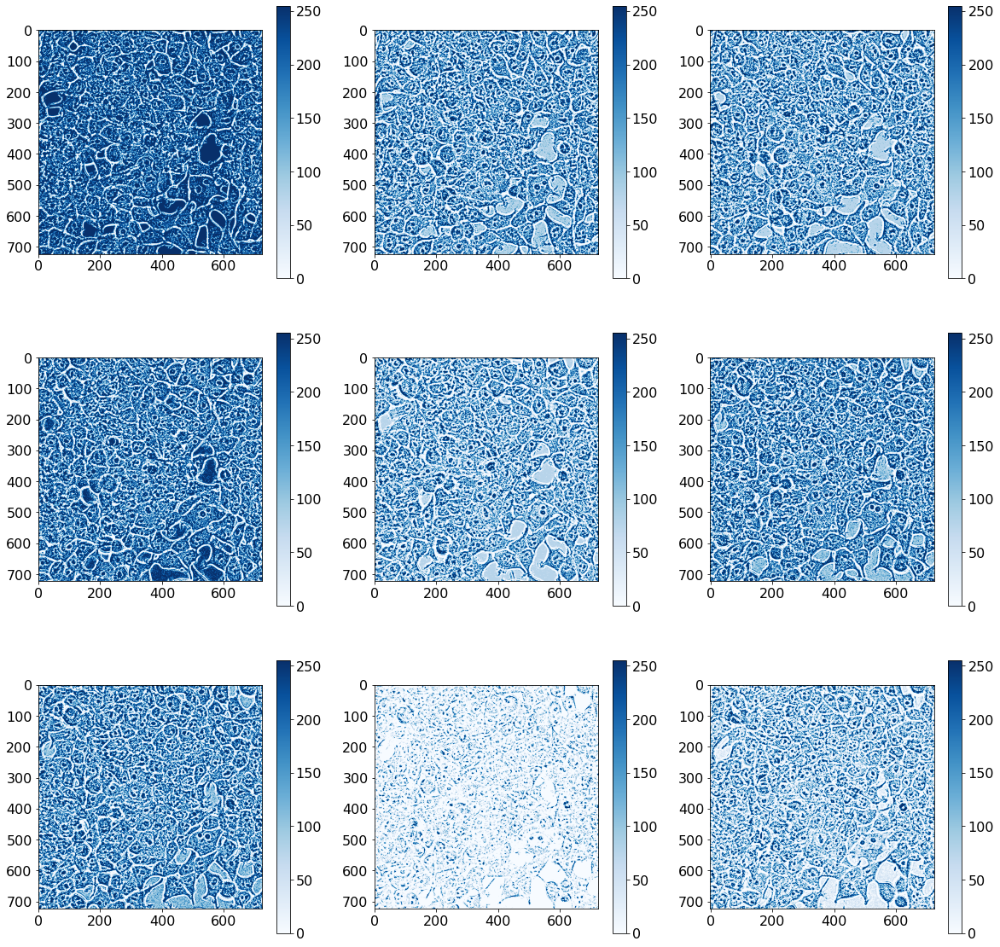

In [123]:
visualize3(thr3[:9], format= 'Blues')

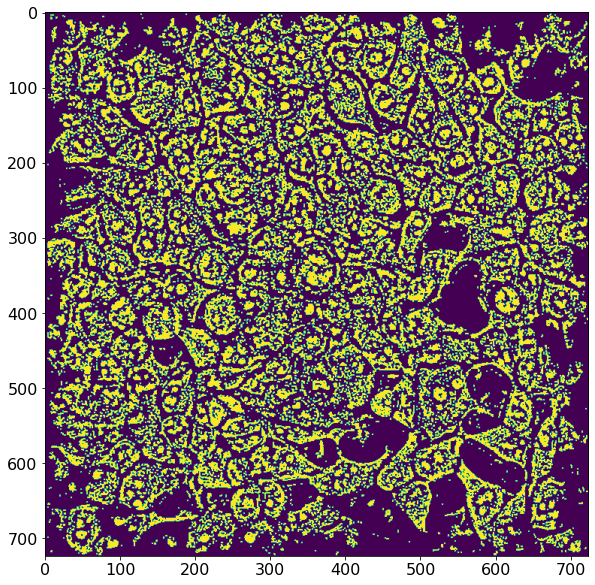

In [133]:
cells=thr3[1].astype('uint8') 


pixels_to_um = 0.300 # 1 pixel = 300 nm 
ret1, thresh = cv2.threshold(cells, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

kernel = np.ones((2,2),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 1)

from skimage.segmentation import clear_border
opening = clear_border(opening) 

plt.figure(figsize=(10, 10))
plt.imshow(opening)
plt.show()

In [134]:

sure_bg = cv2.dilate(opening,kernel,iterations=10)
dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
ret2, sure_fg = cv2.threshold(dist_transform,0.25*dist_transform.max(),255,0)
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)

#Now let's create a marker and label of the regions. 
ret3, markers = cv2.connectedComponents(sure_fg)

In [135]:
from skimage import measure, color, io
imgBRG = cv2.cvtColor(cells, cv2.COLOR_GRAY2BGR)

markers = markers+10
markers[unknown==255] = 0

markers = cv2.watershed(imgBRG, markers)
imgBRG[markers == -1] = [0,255,255]  

img2 = color.label2rgb(markers, bg_label=0)


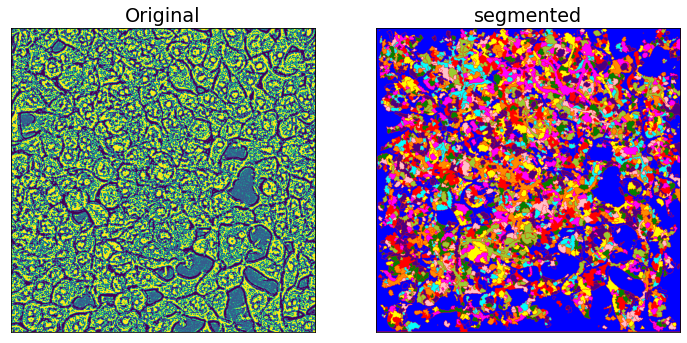

In [136]:
plt.figure(figsize=(12, 12))

plt.subplot(121),plt.imshow(cells),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(img2),plt.title('segmented')
plt.xticks([]), plt.yticks([])
plt.show()


# plt.imshow(img2)
# plt.show()

Oops! watershed segmentation seems not working well here. Let's see the problems and how I can answer them.

=========================================================================================



## My interpretation of problem 1. part A : 

##### “Rate at which expression of virus grows” 

Should somewhat means *“rate of virus growth as measured by the fluorescence indicator in the second channel”*.

lets take a look at the total amount of virus per frame in the whole video:

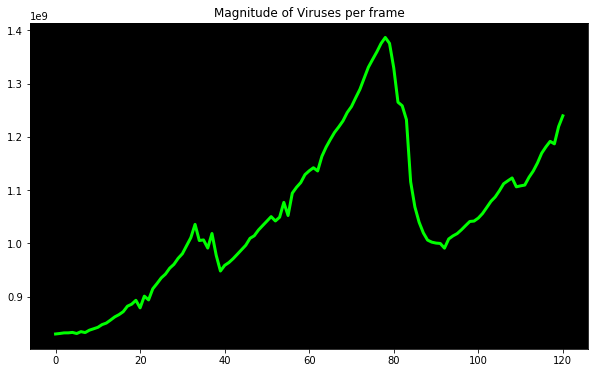

In [14]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
ax.set_facecolor((0.0, 0.0, 0.0))

all_virus = np.array([np.sum(virus) for virus in virus_amts])
plt.plot(np.arange(len(all_virus)), all_virus, c='lime', linewidth = 3)
plt.title('Magnitude of Viruses per frame');












I know bacteria growth rate is exponential but do not have any idea about viruses. I assume this will be exponential growth too. So, having a coefficient for that exponent would be ideal. The formula for exponential growth of a variable x at the growth rate r, as time t goes on in discrete intervals (that is, at integer times 0, 1, 2, 3, ...), is:


$$x_{t}=x_{0}(1+r)^{t}$$


where $x_0$ is the value of $x$ at time $0$. 

The ideal way to compute the above formula is to track the infected cells and compute the total number of the virus inside each cell from infection time to burst time of a cell. However there is simpler way. We can cut a patch of the image in which the cell is infected and then compute the amount of virus at that cell/frame. 

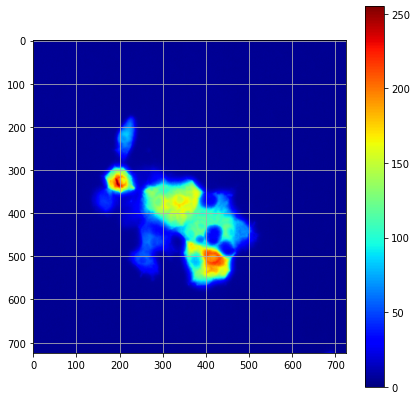

In [15]:
plt.figure(figsize=(7, 7))
plt.imshow(colored_noremd_va[35], cmap= 'jet')
plt.colorbar()
plt.grid(True)

In [16]:
import matplotlib.patches as patches

def plot_big2(x, w=8.5, h=6):
    fig, ax = plt.subplots(1)    # Create a Rectangle patch
    ax.imshow(x, cmap='gray')

    rect1 = patches.Rectangle((200,475),110, 120,linewidth=2,edgecolor='r',facecolor='none')

    # Add the patch to the Axes
    ax.add_patch(rect1)
    fig.set_size_inches(w, h)
    plt.title('A patch of infected cells in 2nd channel')
    plt.show()

<Figure size 864x864 with 0 Axes>

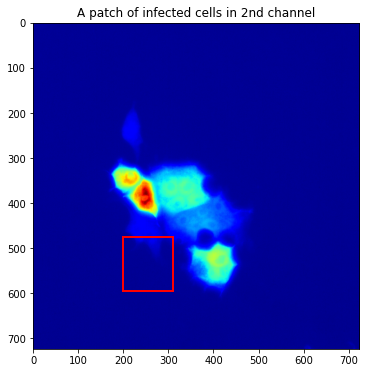

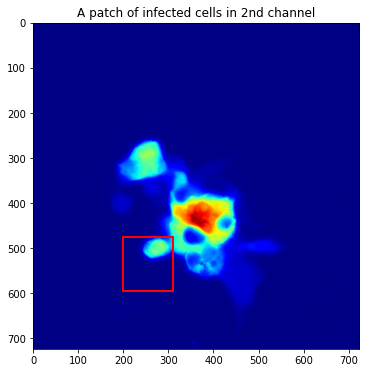

In [17]:
plt.figure(figsize=(12, 12))

plot_big2(colored_noremd_va[26])
plot_big2(colored_noremd_va[80])

In [18]:
infected_patch = colored_noremd_va[0:111, 475:595, 200:305]
infected_real = virus_amts[0:111, 475:595, 200:305]

infected_patch.shape, np.min(infected_patch[0]), np.max(infected_patch[0])

((111, 120, 105, 3), 0, 150)

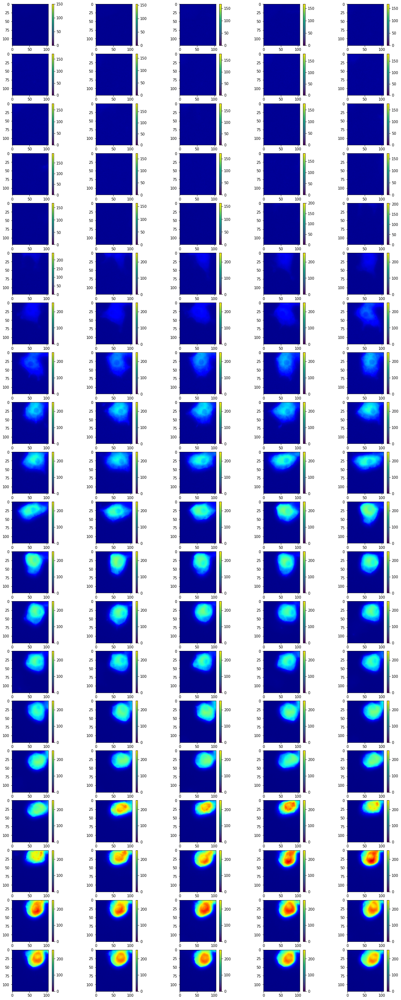

In [19]:
visualize2(infected_patch[:100])

OK! Now we have a patch that indicates number of viruses from beging of cell invasion till the end of the process. Now we can compute the amount of viruses per frame for the above specific cell. 

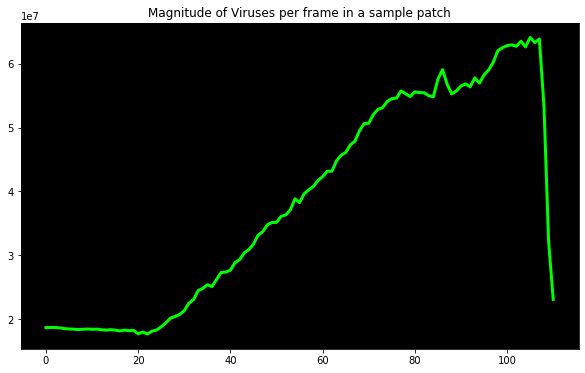

In [20]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
ax.set_facecolor((0.0, 0.0, 0.0))
sample_cell = np.array([np.sum(virus) for virus in infected_real])
plt.plot(np.arange(len(sample_cell)), sample_cell, c='lime', linewidth = 3)
plt.title('Magnitude of Viruses per frame in a sample patch');

In [21]:
y= sample_cell
x= np.arange(len(sample_cell))


a = -133.87368298798796 , b = 22560.8640788281, c = -493815.3002071615, d = 20246626.088240046


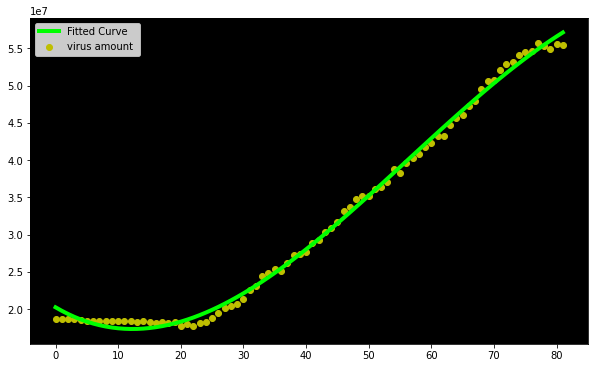

In [22]:
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import numpy as np
import sympy as sym


x = np.array(x[:82], dtype=float) #transform your data in a numpy array of floats 
y = np.array(y[:82], dtype=float) #so the curve_fit can work

"""
create a function to fit with your data. a, b, c and d are the coefficients
that curve_fit will calculate for you. 
In this part you need to guess and/or use mathematical knowledge to find
a function that resembles your data
"""
def func(x, a, b, c, d):
    return a*x**3 + b*x**2 +c*x + d

popt, pcov = curve_fit(func, x, y)

print ("a = %s , b = %s, c = %s, d = %s" % (popt[0], popt[1], popt[2], popt[3]))

"""
Use sympy to generate the latex sintax of the function
"""
xs = sym.Symbol('\lambda')    
tex = sym.latex(func(xs,*popt)).replace('$', '')

"""
Print the coefficients and plot the funcion.
"""
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
ax.set_facecolor((0.0, 0.0, 0.0))

plt.scatter(x, y, c= 'y', label="virus amount ")
plt.plot(x, func(x, *popt), c='lime', linewidth = 4, label="Fitted Curve") #same as line above \/
#plt.plot(x, popt[0]*x**3 + popt[1]*x**2 + popt[2]*x + popt[3], label="Fitted Curve") 

plt.legend(loc='upper left')
plt.show()

##### Hmmm! It looks like the virus growth is linear!?

Let's find the best line that fits the above curve. Thus, the slope of that line wil represent growth rate of virus. 

In [23]:
np.where([sample_cell == np.max(sample_cell)])

(array([0]), array([105]))

In [24]:
x = np.arange(len(sample_cell))
y = sample_cell
points = np.vstack([x[:79], np.ones(79)]).T
points.shape, y.shape
m, c = np.linalg.lstsq(points, y[:79], rcond=None)[0]
m, c

(533572.4639727359, 10186953.398734177)

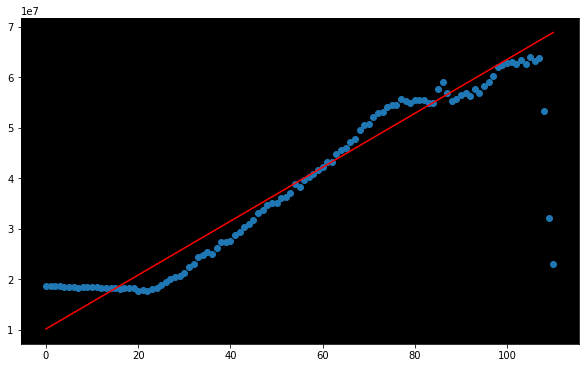

In [25]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
ax.set_facecolor((0.0, 0.0, 0.0))
plt.scatter(x, y)
plt.plot(x, m * x + c, 'r')
plt.show()

We know that the number of cells are calculated per frame. Moreover we know that each frame consists of 15 minutes. Thus, if we are going to compute the rate of growth per second we need to convert our frames into seconds: $80*15*60 = 72000 $

Thus in average the growth rate will be: $m/72000 = 585434/72000 =~ 8.13$ virus/second From when a virus enters a cell till the cell decay time. 

In [26]:
m

533572.4639727359

In [27]:
a = np.sum(virus_amts[0])*14
b = np.sum(virus_amts[-1])
a, b, b-a

(11618713344.0, 1239453300.0, -10379260032.0)

In [28]:
b = np.sum(virus_amts[0])*8.13*(len(virus_amts)*15*60)

In [29]:
80*15*60

72000

=========================================================================================



## My interpretation of problem 1. part B : 

#### I interpret it as: 

what is the infection cycle length (probably best to identify specific “milestone” timepoints: exposure -> infection, infection -> max growth, max growth -> ?)

In [30]:
print('number of virus in the illustrated patch at frame 0 :',sample_cell[0])

number of virus in the illustrated patch at frame 0 : 18677368.0


If we consider the previous patch in part A, We can assume that the exposure time will be probably from frame 0 to frame 20 (In this case even the amount of viruses in the patch at frame 0 is not 0. it means that there exist a base amount of the virus from frame 0), then we the growth rate is accelerated till the pick at somewhere around frame 26, Then it goes down till frame 111. Now let's compute the cycle time:  

In [31]:
print('Exposure -> infection time : ', str(20*15*60) + ' Sec.')
print('Infection -> max growth time :', str((106-20)*15*60) + ' Sec.') 
print('max growth -> decay time :' , str((111-106)*15*60) + ' Sec.')
print('Total cycle time :' , str(111*15*60) + ' Sec.')


Exposure -> infection time :  18000 Sec.
Infection -> max growth time : 77400 Sec.
max growth -> decay time : 4500 Sec.
Total cycle time : 99900 Sec.


In [32]:
np.sum(virus_amts[0, :11 , -11:])

177863.0

=========================================================================================

## My interpretation of problem 1. part C :



I interpret it as:

how fast do nuclei move in infected vs uninfected cells. The correct way is to track the nuclei of both the infected cells and the Normal cells. For that we can detect the nuclei using blob detection and then specify the normal and infected nuclei. So, we can track them along video and compare the speed of the both together. because of matter of time, I selected another way and used optical flows in phase images to measure the mean displament in 2 selected patches: one from infected cell and another one from normal cells. Then computed the speed of the cells' motility and compared them together.



In [33]:
import matplotlib.patches as patches

vid1 = '/home/msf47/Data/exercise_RnDEng_2021/Data/problem1_viralpropagation.tif'    
def plot_big2(x, w=6, h=6):
    fig, ax = plt.subplots(1)    # Create a Rectangle patch
    ax.imshow(x, cmap='gray')

    rect1 = patches.Rectangle((180,260),200, 200,linewidth=1,edgecolor='r',facecolor='none')
    rect2 = patches.Rectangle((500,40),200,200,linewidth=1,edgecolor='lime',facecolor='none')

    # Add the patch to the Axes
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    fig.set_size_inches(w, h)
    plt.title('A patch of normal cells VS a patch of infected cells')
    plt.show()

<Figure size 864x864 with 0 Axes>

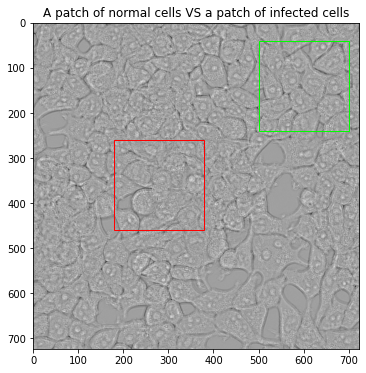

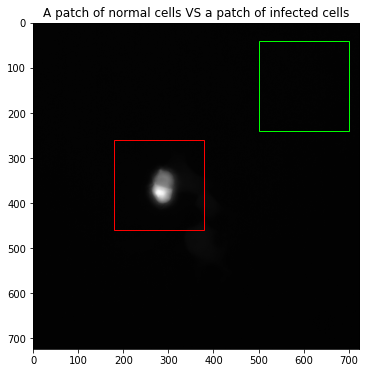

In [34]:
plt.figure(figsize=(12, 12))

plot_big2(normed_images[0])
plot_big2(virus_amts[0])

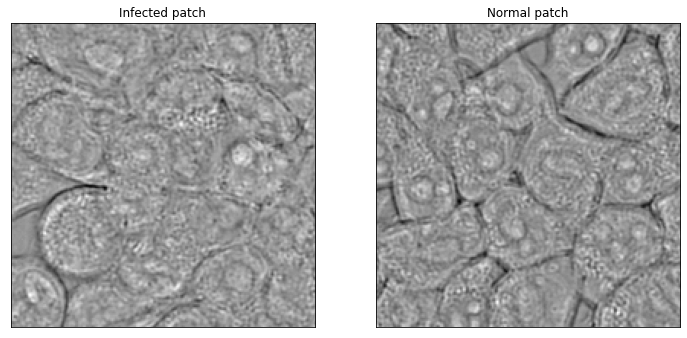

In [35]:
plt.figure(figsize=(12, 12))

plt.subplot(121), plt.imshow(normed_images[0, 260:460, 200:400], cmap='gray'), plt.title('Infected patch')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(normed_images[0, 40:240, 500:700], cmap='gray'), plt.title('Normal patch')
plt.xticks([]), plt.yticks([])
plt.show()

In [36]:
infected_patches = normed_images[30:, 260:460, 200:400]
Normal_patches = normed_images[30:, 40:240, 500:700]
Normal_patches.shape, np.min(Normal_patches[0]), np.max(Normal_patches[0])

((91, 200, 200), 15.222321, 255.0)

In [37]:
def numpy2mp4(data, filepath, dsize1, dsize2):
    data_res= np.array([cv2.resize(img, dsize1, interpolation=cv2.INTER_CUBIC) for img in data])
    v = cv2.VideoWriter(filepath, fourcc = cv2.VideoWriter_fourcc(*'avc1'), isColor= False, fps= 15.15,apiPreference=cv2.CAP_FFMPEG, frameSize= dsize1)
    for datum in data_res:
        v.write(np.uint8(datum))
    v.release()


In [38]:
dsize1, dsize2 = infected_patches[0].shape, Normal_patches[0].shape
numpy2mp4(infected_patches,'/home/msf47/Data/exercise_RnDEng_2021/videos/adj_sample_patch_infected.mp4',dsize1, dsize2)
numpy2mp4(Normal_patches,'/home/msf47/Data/exercise_RnDEng_2021/videos/adj_sample_patch2_Normal.mp4',dsize1, dsize2)
numpy2mp4(normed_images,'/home/msf47/Data/exercise_RnDEng_2021/videos/adj_normed_images.mp4',dsize1, dsize2)


In [39]:
play('/home/msf47/Data/exercise_RnDEng_2021/videos/adj_sample_patch_infected.mp4')

In [40]:
play('/home/msf47/Data/exercise_RnDEng_2021/videos/adj_sample_patch2_Normal.mp4')

In [41]:
def plot_histogram(xs, ys, ticksize=12, fontsize=16, show=True):
    import matplotlib as mpl
    """ Plot a histogram given a numeric vector"""
    f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
    
    font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : fontsize}

    mpl.rc('font', **font)
    
    hist, bins = np.histogram(xs, bins=10)
    width = 0.7 * (bins[1] - bins[0])
    center = (bins[:-1] + bins[1:]) / 2
    ax1.bar(center, hist, align='center', width=width)
    ax1.text(0.55, 0.8,"mean: %.3f" % np.mean(xs), horizontalalignment='left',
             verticalalignment='center', transform = ax1.transAxes)
    ax1.text(0.55, 0.72,"stdev: %.3f" % np.std(xs), horizontalalignment='left',
         verticalalignment='center', transform = ax1.transAxes)
    ax1.set_xlabel("delta x", fontsize=fontsize)
    ax1.set_ylabel("Frequency", fontsize=fontsize)
    ax2.tick_params(axis='both', which='major', labelsize=ticksize)
    
    hist, bins = np.histogram(ys, bins=10)
    width = 0.7 * (bins[1] - bins[0])
    center = (bins[:-1] + bins[1:]) / 2
    ax2.bar(center, hist, align='center', width=width)
    ax2.text(0.55, 0.8,"mean: %.3f" % np.mean(ys), horizontalalignment='left',
             verticalalignment='center', transform = ax2.transAxes)
    ax2.text(0.55, 0.72,"stdev: %.3f" % np.std(ys), horizontalalignment='left',
         verticalalignment='center', transform = ax2.transAxes)
    ax2.set_xlabel("delta y", fontsize=fontsize)
    ax2.tick_params(axis='both', which='major', labelsize=ticksize)

    if show:
        plt.show()
    return f

In [42]:
mdx1, mdy1 = get_optical_flow('/home/msf47/Data/exercise_RnDEng_2021/videos/adj_sample_patch_infected.mp4')
mdx2, mdy2 = get_optical_flow('/home/msf47/Data/exercise_RnDEng_2021/videos/adj_sample_patch2_Normal.mp4')

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


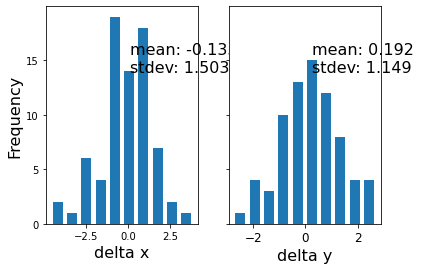

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


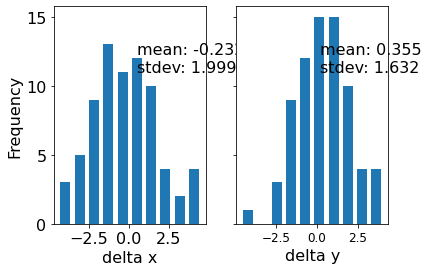

In [43]:
fig1 = plot_histogram(mdx1, mdy1)
fig2 = plot_histogram(mdx2, mdy2)

As we can see above the motility of normal cells are in average 0.345 pixels in x direction and 0.126 pixels in y direction. However, the infected cells motility was around -0.05 in x direction and 0.05 in y direction. This shows that the average speed of normal cells are faster than infected cells

/home/msf47/miniconda3/envs/Mojtaba3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/msf47/miniconda3/envs/Mojtaba3/lib/python3.8/site-packages/seaborn/axisgrid.py:2182: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/home/msf47/miniconda3/envs/Mojtaba3/lib/python3.8/site-packages/seaborn/distributions.py:1210: UserWarning: The following kwargs were not used by contour: 'stat_func'
  cset = contour_func(
/home/msf47/miniconda3/envs/Mojtaba3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other 

Text(0.5, 0.98, 'Average 2D motion magnitiude of motion for NORMAL Cells')

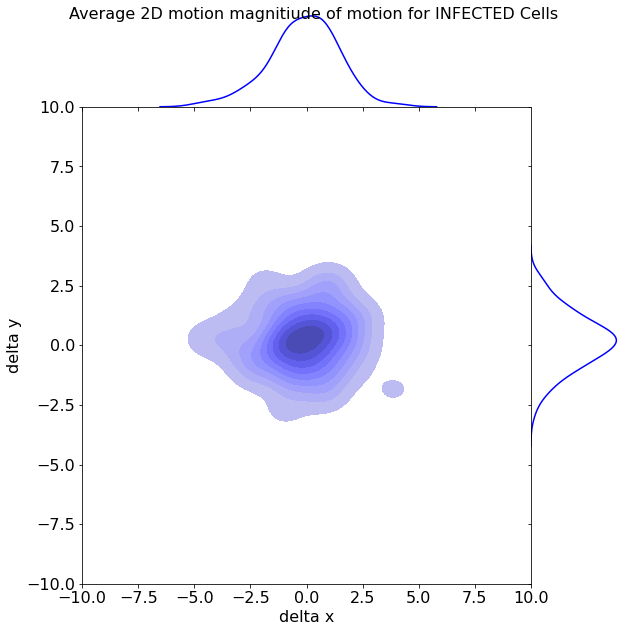

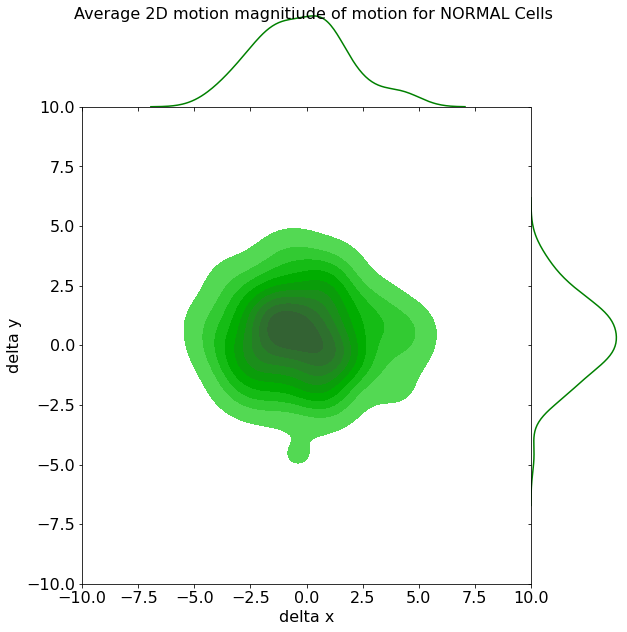

In [51]:
# plot one 2D histogram per video
import seaborn as sns
sns.set_palette(sns.color_palette("dark"))
import pandas as pd

# xs_a.append(mdx1)
# ys_a.append(mdy1)

# xs_b.append(mdx2)
# ys_b.append(mdy2)

x_a = pd.Series(np.array(mdx1), name="delta x")
y_a = pd.Series(np.array(mdy1), name="delta y")

x_b = pd.Series(np.array(mdx2), name="delta x")
y_b = pd.Series(np.array(mdy2), name="delta y")


title1='Average 2D motion magnitiude of motion for INFECTED Cells'
title2='Average 2D motion magnitiude of motion for NORMAL Cells'


g1 = sns.jointplot(x_a, y_a, kind="kde", shade=True, stat_func=None, size=9, space=0,
               xlim=(-10, 10), ylim=(-10, 10), color = 'b')
g1.fig.suptitle(title1, size=16)

g2 = sns.jointplot(x_b, y_b, kind="kde", shade=True, stat_func=None, size=9, space=0,
               xlim=(-10, 10), ylim=(-10, 10), color = 'g')
g2.fig.suptitle(title2, size=16)


/home/msf47/miniconda3/envs/Mojtaba3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/msf47/miniconda3/envs/Mojtaba3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


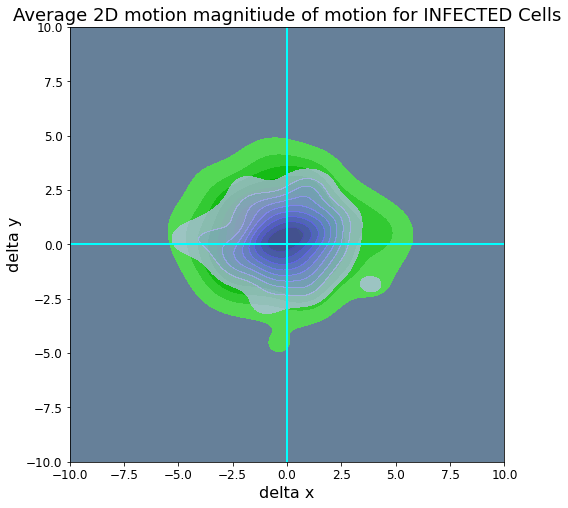

In [72]:

f, ax = plt.subplots(figsize=(8, 8))
ax.set_aspect("equal")
ax.set_facecolor((0.4, 0.5, 0.6))
ax = sns.kdeplot(np.array(x_b), np.array(y_b), linestyles="solid",
                 color='lime', shade=True, alpha=1)
ax = sns.kdeplot(np.array(x_a), np.array(y_a), linestyles="solid",
                 color='Navy', shade=True, alpha=.7)
ax.set_ylim(-10, 10)
ax.set_xlim(-10, 10)
ax.set_title(title1, size=18)
plt.axhline(0, color='cyan', linewidth=2)
plt.axvline(0, color='cyan', linewidth=2)
ax.set_xlabel('delta x', fontsize=16)
ax.set_ylabel('delta y', fontsize=16)
ax.tick_params(axis='both', which='major', labelsize=12)



As it is shown in above figure the total magnitude of the Normal cells are more than the total magnitude of infected cells. As a consquence the normal cells are moving faster. Let's see how much in average the motility is faster in normal cells: 

In [64]:
print('Mean motility in x direction of NORMAL cells: '+ str(np.mean(mdx2)) +' pixels per frame')
print('Mean motility in y direction of NORMAL cells: '+ str(np.mean(mdy2)) +' pixels per frame')

Mean motility in x direction of NORMAL cells: -0.23223014 pixels per frame
Mean motility in y direction of NORMAL cells: 0.35468507 pixels per frame


In [65]:
print('Mean motility in x direction of INFECTED cells: '+ str(np.mean(mdx1)) +' pixels per frame')
print('Mean motility in y direction of INFECTED cells: '+ str(np.mean(mdy1)) +' pixels per frame')

Mean motility in x direction of INFECTED cells: -0.13498272 pixels per frame
Mean motility in y direction of INFECTED cells: 0.19237837 pixels per frame


In [67]:
d_x1 = np.mean(mdx1)
d_y1 = np.mean(mdy1)

d_x2 = np.mean(mdx2)
d_y2 = np.mean(mdy2)

Mag_infected = np.sqrt(d_x1**2 + d_y1**2)
Mag_normal = np.sqrt(d_x2**2 + d_y2**2)

Mag_infected, Mag_normal

(0.2350101544592543, 0.423948506656292)

Thus, the mean of displacement in Normal cells is almost 2 times bigger than infected ones

In [73]:
mean_speed_fr_infected = Mag_infected/1
mean_speed_fr_normal = Mag_infected/1

mean_speed_nm_infected = 300*Mag_infected/15*60
mean_speed_nm_normal = 300*Mag_normal/15*60
mean_speed_nm_normal, mean_speed_nm_infected

(508.73820798755037, 282.0121853511052)

As a result the average speed in healthy cells are around $508$ $nm/sec$, while the average speed in infected cells are around $282$ $nm/sec$.